# Εργασία 4 - Α' ΜΕΡΟΣ: Object Detection για Traffic Sign Detection
## Faster R-CNN & YOLOv3

### Περιγραφή
Υλοποίηση δύο αρχιτεκτονικών για ανίχνευση σημάτων οδικής κυκλοφορίας:
1. **Two-stage detector**: Faster R-CNN
2. **One-stage detector**: YOLOv3

### Dataset: LISA Traffic Sign Dataset
- **9 κλάσεις**: keepRight, merge, pedestrianCrossing, signalAhead, speedLimit25, speedLimit35, stop, yield, yieldAhead
- **Splits**: train, val, test

### Μετρική Αξιολόγησης: mAP (mean Average Precision)

## 1. Εγκατάσταση Βιβλιοθηκών

In [1]:
# Εγκατάσταση απαραίτητων βιβλιοθηκών
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q ultralytics
!pip install -q opencv-python matplotlib pandas
!pip install -q pycocotools
!pip install -q albumentations
!pip install -q torchmetrics

In [2]:
import os
import sys
import torch
import torchvision
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from collections import defaultdict
from tqdm import tqdm
import shutil
import warnings
warnings.filterwarnings('ignore')

!nvidia-smi
!free -h

# Έλεγχος GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")

Sun Feb  1 13:52:01 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   71C    P0             32W /   70W |     834MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 2. Λήψη LISA Traffic Sign Dataset

Κατεβάστε το dataset από: https://vc.ee.duth.gr:6960/index.php/s/Guf8yfeKeNsjLTF/download

In [3]:
import zipfile, glob

DATA_URL = 'https://vc.ee.duth.gr:6960/index.php/s/Guf8yfeKeNsjLTF/download'
ZIP_PATH = '/content/lisa.zip'
DATA_ROOT = '/content/data'

os.makedirs(DATA_ROOT, exist_ok=True)
!wget -q --no-check-certificate -O {ZIP_PATH} "{DATA_URL}"
with zipfile.ZipFile(ZIP_PATH) as z:
    z.extractall(DATA_ROOT)
os.remove(ZIP_PATH)

ANNOTATIONS_FILE = glob.glob(f'{DATA_ROOT}/**/annotations_with_splits.csv', recursive=True)[0]
DATA_DIR = os.path.dirname(ANNOTATIONS_FILE)
print(f"DATA_DIR: {DATA_DIR}")

DATA_DIR: /content/data


In [4]:
df = pd.read_csv(ANNOTATIONS_FILE, sep=';')
df.columns = ['filename', 'x_min', 'y_min', 'x_max', 'y_max', 'class_name']
df['split'] = df['filename'].apply(lambda x: x.split('/')[0])
print(f"Annotations: {len(df)}")
print(df['split'].value_counts())
print(df['class_name'].value_counts())

Annotations: 900
split
train    720
val       90
test      90
Name: count, dtype: int64
class_name
stop                  210
speedLimit35          110
keepRight             110
signalAhead           100
pedestrianCrossing    100
merge                 100
speedLimit25           80
yield                  45
yieldAhead             45
Name: count, dtype: int64


In [5]:
CLASS_NAMES = ['keepRight', 'merge', 'pedestrianCrossing', 'signalAhead', 
               'speedLimit25', 'speedLimit35', 'stop', 'yield', 'yieldAhead']
NUM_CLASSES = len(CLASS_NAMES) + 1
CLASS_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}
IDX_TO_CLASS = {idx: name for idx, name in enumerate(CLASS_NAMES)}
print(f"Classes: {NUM_CLASSES} (9 + background)")

Classes: 10 (9 + background)


## 3. Οπτικοποίηση Δειγμάτων

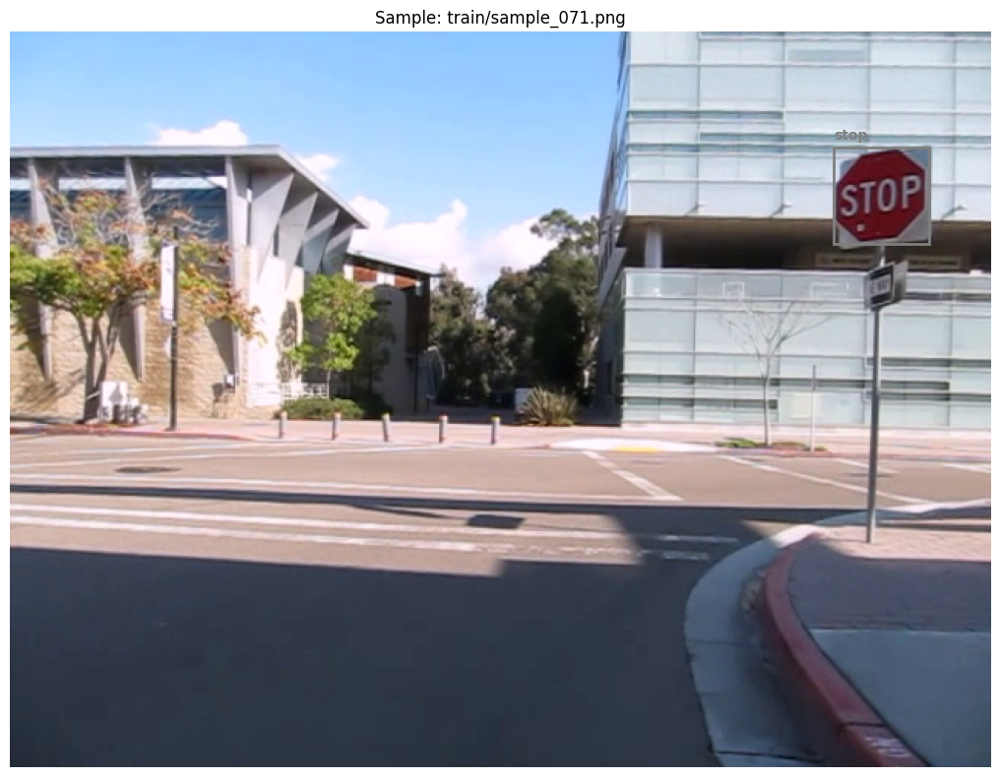

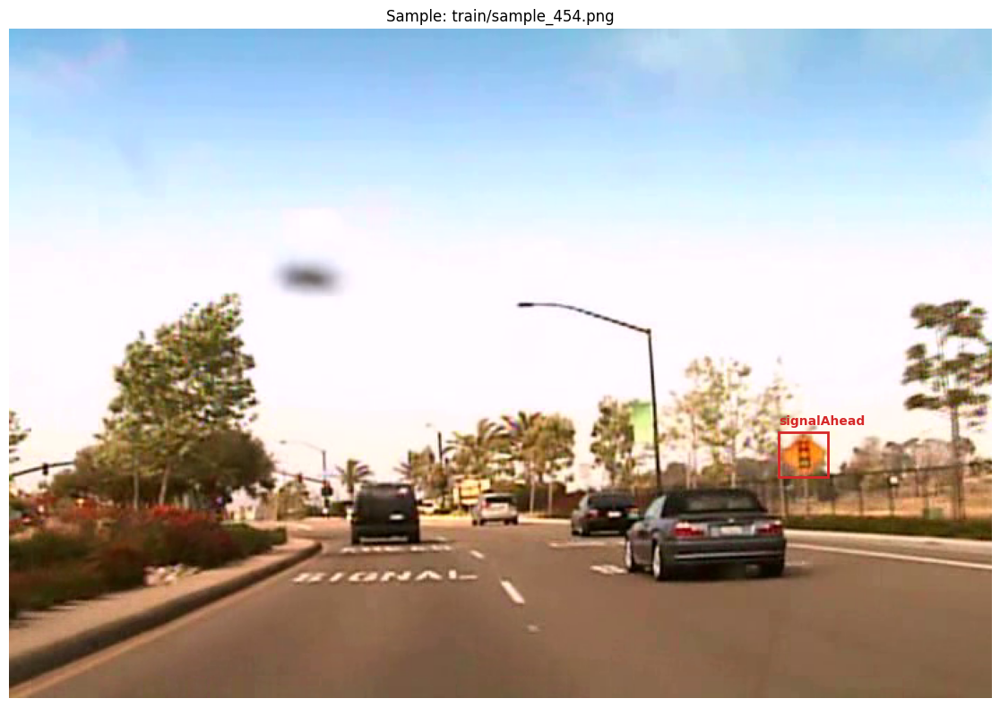

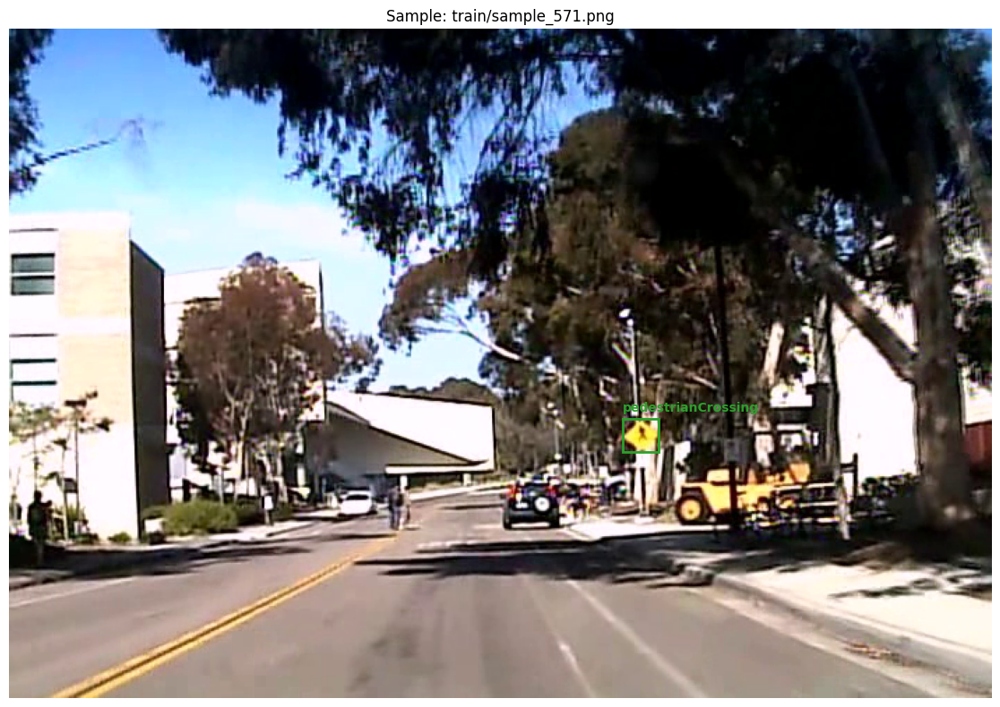

In [6]:
def visualize_sample(df, data_dir, idx=0):
    sample = df.iloc[idx]
    img_path = os.path.join(data_dir, sample['filename'])
    
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(img)
    
    # Όλα τα annotations της εικόνας
    img_anns = df[df['filename'] == sample['filename']]
    colors = plt.cm.tab10(np.linspace(0, 1, len(CLASS_NAMES)))
    
    for _, ann in img_anns.iterrows():
        x_min, y_min = ann['x_min'], ann['y_min']
        x_max, y_max = ann['x_max'], ann['y_max']
        class_name = ann['class_name']
        class_idx = CLASS_TO_IDX.get(class_name, 0)
        color = colors[class_idx]
        
        rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                  linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x_min, y_min - 5, class_name, color=color, fontsize=10, weight='bold')
    
    ax.set_title(f"Sample: {sample['filename']}")
    ax.axis('off')
    plt.tight_layout()
    plt.show()

# Εμφάνιση δειγμάτων
for i in [0, 50, 100]:
    if i < len(df):
        visualize_sample(df, DATA_DIR, i)

---
# ΕΝΟΤΗΤΑ A': Custom Faster R-CNN

## Αρχιτεκτονική Faster R-CNN (Paper: Ren et al., 2015)

Ο **Faster R-CNN** είναι ένας **two-stage object detector** με τα εξής components:

### Stage 1: Region Proposal Network (RPN)
```
Input Image → Backbone CNN → Feature Map → RPN → Region Proposals
```
- Sliding window πάνω στο feature map
- Για κάθε θέση: k anchor boxes (διαφορετικά scales/ratios)
- Output: objectness score + bbox regression

### Stage 2: Detection Network
```
Region Proposals → ROI Pooling → FC layers → Classification + Regression
```
- ROI Pooling: μετατρέπει proposals σε fixed-size features
- Classification: N+1 classes (N objects + background)
- Regression: refinement των bbox coordinates

### Custom Implementation Components:
1. **Backbone**: VGG16-style (conv→conv→pool pattern με padding='same')
2. **RPN**: 3×3 conv + 1×1 conv για cls/reg
3. **ROI Pooling**: 7×7 output
4. **Detection Head**: FC layers → softmax + bbox reg

## 4. Data Augmentation & Preprocessing

Σύμφωνα με την εκφώνηση, εφαρμόζουμε:

| # | Augmentation | Περιγραφή | Implementation |
|---|--------------|-----------|----------------|
| 1 | **Flipping** | Οριζόντια αναστροφή | HorizontalFlip(p=0.5) |
| 2 | **Random Cropping** | Τυχαίο crop + resize | RandomResizedCrop(scale=0.8-1.0) |
| 3 | **Rotation** | Μικρή περιστροφή | Rotate(limit=±10°) |
| 4 | **Zoom** | Scale μεγέθυνση/σμίκρυνση | Affine(scale=0.9-1.1) |

Χρησιμοποιούμε **albumentations** γιατί μετασχηματίζει αυτόματα τα bounding boxes.

In [7]:
import torch.nn as nn
import torch.nn.functional as F
import albumentations as A
from albumentations.pytorch import ToTensorV2

IMG_SIZE = (384, 512)

train_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.HorizontalFlip(p=0.5),
    A.RandomResizedCrop(size=(IMG_SIZE[0], IMG_SIZE[1]), scale=(0.8, 1.0), p=0.5),
    A.Rotate(limit=10, p=0.5, border_mode=cv2.BORDER_CONSTANT),
    A.Affine(scale=(0.9, 1.1), p=0.5),
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels'], min_visibility=0.3))

val_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

print(f"Image size: {IMG_SIZE}")
print("Augmentations: Flip, Crop, Rotate, Zoom + Final Resize")

Image size: (384, 512)
Augmentations: Flip, Crop, Rotate, Zoom + Final Resize


In [8]:
def load_image(img_path, annotations, transform):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    boxes, labels = [], []
    for _, ann in annotations.iterrows():
        if ann['x_max'] > ann['x_min'] and ann['y_max'] > ann['y_min']:
            boxes.append([ann['x_min'], ann['y_min'], ann['x_max'], ann['y_max']])
            labels.append(CLASS_TO_IDX[ann['class_name']] + 1)
    
    if len(boxes) == 0:
        boxes, labels = [[0, 0, 1, 1]], [0]
    
    transformed = transform(image=img, bboxes=boxes, labels=labels)
    img = transformed['image']
    boxes = list(transformed['bboxes']) or [[0, 0, 1, 1]]
    labels = list(transformed['labels']) or [0]
    
    return img, {
        'boxes': torch.tensor(boxes, dtype=torch.float32),
        'labels': torch.tensor(labels, dtype=torch.int64)
    }

def prepare_data(df, data_dir, split, transform):
    split_df = df[df['split'] == split]
    data = []
    for img_name in split_df['filename'].unique():
        img_path = os.path.join(data_dir, img_name)
        anns = split_df[split_df['filename'] == img_name]
        data.append((img_path, anns, transform))
    return data

train_data = prepare_data(df, DATA_DIR, 'train', train_transform)
val_data = prepare_data(df, DATA_DIR, 'val', val_transform)
test_data = prepare_data(df, DATA_DIR, 'test', val_transform)

print(f"Train: {len(train_data)}, Val: {len(val_data)}, Test: {len(test_data)}")

Train: 720, Val: 90, Test: 90


In [9]:
from torch.utils.data import DataLoader

BATCH_SIZE = 1

def get_sample(data, idx):
    img, target = load_image(*data[idx])
    target['image_id'] = torch.tensor([idx])
    target['area'] = (target['boxes'][:, 3] - target['boxes'][:, 1]) * (target['boxes'][:, 2] - target['boxes'][:, 0])
    target['iscrowd'] = torch.zeros(len(target['boxes']), dtype=torch.int64)
    return img, target

def collate(batch):
    return tuple(zip(*batch))

train_ds = type('D', (), {'__len__': lambda s: len(train_data), '__getitem__': lambda s, i: get_sample(train_data, i)})()
val_ds = type('D', (), {'__len__': lambda s: len(val_data), '__getitem__': lambda s, i: get_sample(val_data, i)})()
test_ds = type('D', (), {'__len__': lambda s: len(test_data), '__getitem__': lambda s, i: get_sample(test_data, i)})()

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, collate_fn=collate)
val_loader = DataLoader(val_ds, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, collate_fn=collate)

print(f"Batch size: {BATCH_SIZE}, Train batches: {len(train_loader)}")

Batch size: 1, Train batches: 720


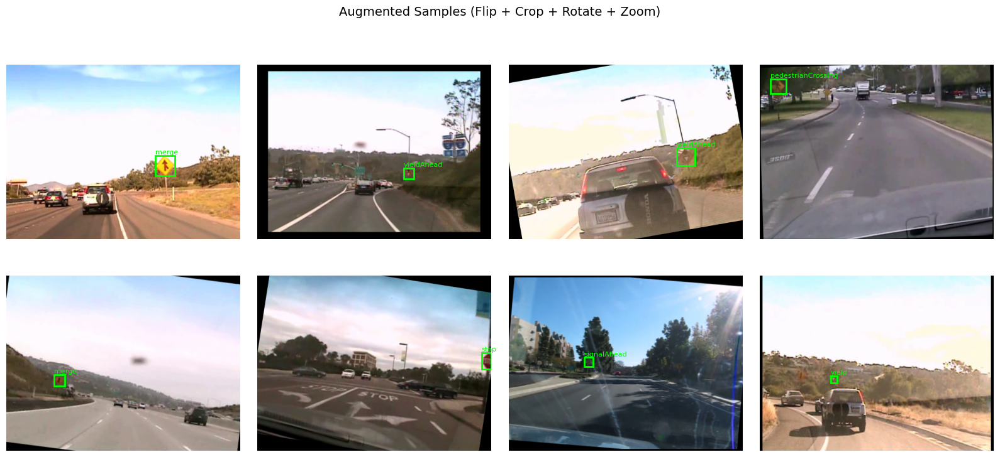

In [10]:
# Οπτικοποίηση Augmented Samples
fig, axes = plt.subplots(2, 4, figsize=(16, 8))

for i, ax in enumerate(axes.flatten()):
    idx = np.random.randint(len(train_ds))
    img, target = train_ds[idx]
    
    img_np = img.permute(1, 2, 0).numpy()
    img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
    img_np = np.clip(img_np, 0, 1)
    
    ax.imshow(img_np)
    for box, lbl in zip(target['boxes'], target['labels']):
        if lbl > 0:
            x1, y1, x2, y2 = box.numpy()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, lw=2, ec='lime', fc='none')
            ax.add_patch(rect)
            ax.text(x1, y1-3, CLASS_NAMES[lbl-1], color='lime', fontsize=8)
    ax.axis('off')

plt.suptitle('Augmented Samples (Flip + Crop + Rotate + Zoom)', fontsize=14)
plt.tight_layout()
plt.show()

## 5. Faster R-CNN (Torchvision Implementation)

Χρησιμοποιούμε το **torchvision.models.detection.fasterrcnn_resnet50_fpn** όπως παρουσιάστηκε στο εργαστήριο.

### Αρχιτεκτονική Faster R-CNN (Paper: Ren et al., 2015)

Ο **Faster R-CNN** είναι ένας **two-stage object detector**:

| Stage | Component | Περιγραφή |
|-------|-----------|-----------|
| **Backbone** | ResNet-50 + FPN | Feature Pyramid Network για multi-scale detection |
| **Stage 1** | RPN | Region Proposal Network - προτείνει candidate boxes |
| **Stage 2** | Detection Head | ROI Align + FC layers για classification & regression |

### Components:
1. **ResNet-50**: 50-layer deep residual network (pretrained on ImageNet)
2. **FPN**: Feature Pyramid Network για multi-scale features
3. **RPN**: 3×3 conv + 1×1 conv για objectness + bbox regression
4. **ROI Align**: Ακριβέστερο από ROI Pooling (bilinear interpolation)
5. **Detection Head**: 2 FC layers → classification + bbox refinement

In [11]:
# Torchvision Faster R-CNN με ResNet50-FPN backbone
from torchvision.models.detection import fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def build_faster_rcnn(num_classes):
    # Load pretrained Faster R-CNN (COCO weights)
    model = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1)
    
    # Replace classification head για τις δικές μας κλάσεις
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    
    return model

# Build model
faster_rcnn = build_faster_rcnn(NUM_CLASSES)
faster_rcnn = faster_rcnn.to(device)

total_params = sum(p.numel() for p in faster_rcnn.parameters())
trainable_params = sum(p.numel() for p in faster_rcnn.parameters() if p.requires_grad)

print(f"Faster R-CNN (Torchvision)")
print(f"  Classes: {NUM_CLASSES} (9 + background)")
print(f"  Total params: {total_params:,}")
print(f"  Trainable: {trainable_params:,}")
print(f"\nArchitecture:")
print(f"  Backbone: ResNet-50 + FPN (pretrained on ImageNet/COCO)")
print(f"  RPN: Multi-scale anchors per FPN level")
print(f"  ROI Align: 7x7 output")
print(f"  Detection Head: FC(1024) → FC(1024) → cls/reg")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 190MB/s] 


Faster R-CNN (Torchvision)
  Classes: 10 (9 + background)
  Total params: 41,340,161
  Trainable: 41,117,761

Architecture:
  Backbone: ResNet-50 + FPN (pretrained on ImageNet/COCO)
  RPN: Multi-scale anchors per FPN level
  ROI Align: 7x7 output
  Detection Head: FC(1024) → FC(1024) → cls/reg


### Faster R-CNN Architecture Table

| Component | Details |
|-----------|---------|
| **Input** | Image (resized, normalized) |
| **Backbone** | ResNet-50 (pretrained ImageNet) |
| **Feature Pyramid** | FPN with 5 levels (P2-P6) |
| **RPN (Stage 1)** | 3×3 Conv → 1×1 Conv, multi-scale anchors |
| **Proposals** | ~2000 training, ~1000 inference (after NMS) |
| **ROI Align** | 7×7 pooled features per proposal |
| **Detection Head (Stage 2)** | FC(1024) → FC(1024) → cls/reg |
| **Output** | N×(num_classes) scores + N×(4×num_classes) boxes |

## 6. Training Configuration

### Δικαιολόγηση Παραμέτρων:
- **Epochs=10**: Αρκετά για fine-tuning με pretrained COCO weights
- **Batch Size=2**: Max για Colab T4 GPU memory με ResNet50-FPN
- **LR=0.005**: Standard για fine-tuning detection models
- **SGD+momentum**: Σταθερότερη σύγκλιση
- **StepLR**: Μείωση LR κατά 10x στο epoch 7

In [12]:
NUM_EPOCHS = 10
LR = 0.005
MOMENTUM = 0.9
WEIGHT_DECAY = 0.0005

optimizer = torch.optim.SGD(faster_rcnn.parameters(), lr=LR, momentum=MOMENTUM, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

print("Training Configuration:")
print(f"  Epochs: {NUM_EPOCHS}")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Learning Rate: {LR}")
print(f"  Optimizer: SGD (momentum={MOMENTUM})")
print(f"  Scheduler: StepLR (step_size=7, gamma=0.1)")
print(f"\nAugmentation:")
print(f"  1. Horizontal Flip (p=0.5)")
print(f"  2. Random Crop (scale=0.8-1.0)")
print(f"  3. Rotation (±10°)")
print(f"  4. Zoom (scale=0.9-1.1)")

Training Configuration:
  Epochs: 10
  Batch Size: 1
  Learning Rate: 0.005
  Optimizer: SGD (momentum=0.9)
  Scheduler: StepLR (step_size=7, gamma=0.1)

Augmentation:
  1. Horizontal Flip (p=0.5)
  2. Random Crop (scale=0.8-1.0)
  3. Rotation (±10°)
  4. Zoom (scale=0.9-1.1)


## 7. Training Loop

Το torchvision Faster R-CNN API υπολογίζει αυτόματα τα losses όταν είναι σε training mode.

In [13]:
train_losses = []

torch.cuda.empty_cache()
print("Έναρξη εκπαίδευσης Faster R-CNN...")
print(f"Batch size: {BATCH_SIZE}")
print("="*50)

for epoch in range(NUM_EPOCHS):
    faster_rcnn.train()
    epoch_loss = 0
    
    pbar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{NUM_EPOCHS}')
    for images, targets in pbar:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        
        # Forward - model returns loss dict in training mode
        loss_dict = faster_rcnn(images, targets)
        loss = sum(loss_dict.values())
        
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(faster_rcnn.parameters(), max_norm=10.0)
        optimizer.step()
        
        epoch_loss += loss.item()
        pbar.set_postfix({'loss': f'{loss.item():.4f}'})
    
    scheduler.step()
    avg_loss = epoch_loss / len(train_loader)
    train_losses.append(avg_loss)
    
    print(f'Epoch {epoch+1}/{NUM_EPOCHS} - Loss: {avg_loss:.4f} - LR: {scheduler.get_last_lr()[0]:.6f}')
    
    if avg_loss == min(train_losses):
        torch.save(faster_rcnn.state_dict(), 'faster_rcnn_best.pth')
        print('  → Saved best model')

torch.save(faster_rcnn.state_dict(), 'faster_rcnn_final.pth')
print("\nTraining completed!")

Έναρξη εκπαίδευσης Faster R-CNN...
Batch size: 1


Epoch 1/10: 100%|██████████| 720/720 [03:14<00:00,  3.70it/s, loss=0.1413]


Epoch 1/10 - Loss: 0.1864 - LR: 0.005000
  → Saved best model


Epoch 2/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.1003]


Epoch 2/10 - Loss: 0.1227 - LR: 0.005000
  → Saved best model


Epoch 3/10: 100%|██████████| 720/720 [03:13<00:00,  3.71it/s, loss=0.1153]


Epoch 3/10 - Loss: 0.0925 - LR: 0.005000
  → Saved best model


Epoch 4/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.0951]


Epoch 4/10 - Loss: 0.0898 - LR: 0.005000
  → Saved best model


Epoch 5/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.1140]


Epoch 5/10 - Loss: 0.0901 - LR: 0.005000


Epoch 6/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.1235]


Epoch 6/10 - Loss: 0.0804 - LR: 0.005000
  → Saved best model


Epoch 7/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.0367]


Epoch 7/10 - Loss: 0.0767 - LR: 0.000500
  → Saved best model


Epoch 8/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.0510]


Epoch 8/10 - Loss: 0.0571 - LR: 0.000500
  → Saved best model


Epoch 9/10: 100%|██████████| 720/720 [03:13<00:00,  3.72it/s, loss=0.0282]


Epoch 9/10 - Loss: 0.0547 - LR: 0.000500
  → Saved best model


Epoch 10/10: 100%|██████████| 720/720 [03:14<00:00,  3.71it/s, loss=0.0375]


Epoch 10/10 - Loss: 0.0517 - LR: 0.000500
  → Saved best model

Training completed!


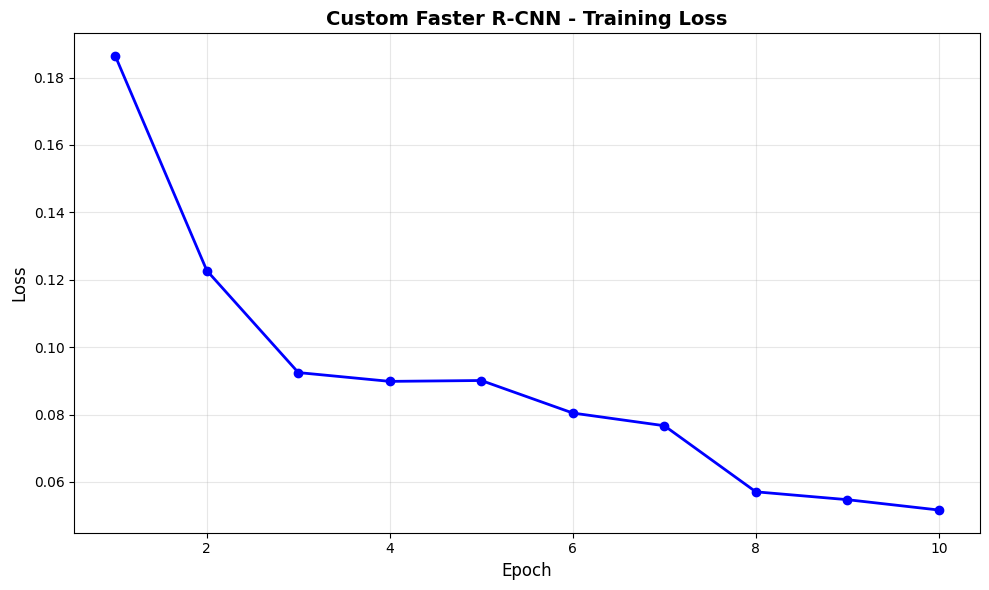

In [14]:
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(range(1, len(train_losses)+1), train_losses, 'b-o', linewidth=2, markersize=6)
ax.set_xlabel('Epoch', fontsize=12)
ax.set_ylabel('Loss', fontsize=12)
ax.set_title('Custom Faster R-CNN - Training Loss', fontsize=14, weight='bold')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('faster_rcnn_training_loss.png', dpi=150)
plt.show()

## 8. Αξιολόγηση με mAP (mean Average Precision)

Η μετρική **mAP** υπολογίζεται με `torchmetrics.detection.MeanAveragePrecision`:
- **mAP@0.5**: Precision με IoU threshold = 0.5
- **mAP@0.5:0.95**: Μέσος όρος για IoU thresholds [0.5, 0.55, ..., 0.95]
- **mAP@0.75**: Precision με IoU threshold = 0.75 (stricter)

In [15]:
from torchmetrics.detection import MeanAveragePrecision

def evaluate_frcnn(model, data_loader, device):
    model.eval()
    metric = MeanAveragePrecision(iou_type='bbox')
    
    with torch.no_grad():
        for images, targets in tqdm(data_loader, desc='Evaluating'):
            images = [img.to(device) for img in images]
            
            # Inference mode - returns predictions
            outputs = model(images)
            
            preds = []
            gts = []
            for out, tgt in zip(outputs, targets):
                preds.append({
                    'boxes': out['boxes'].cpu(),
                    'scores': out['scores'].cpu(),
                    'labels': out['labels'].cpu()
                })
                gts.append({
                    'boxes': tgt['boxes'],
                    'labels': tgt['labels']
                })
            
            metric.update(preds, gts)
    
    return metric.compute()

# Load best model
faster_rcnn.load_state_dict(torch.load('faster_rcnn_best.pth', weights_only=True))
frcnn_results = evaluate_frcnn(faster_rcnn, test_loader, device)

print("\n" + "="*50)
print("FASTER R-CNN - ΑΠΟΤΕΛΕΣΜΑΤΑ mAP")
print("="*50)
print(f"  mAP@0.5:      {frcnn_results['map_50'].item():.4f}")
print(f"  mAP@0.5:0.95: {frcnn_results['map'].item():.4f}")
print(f"  mAP@0.75:     {frcnn_results['map_75'].item():.4f}")
print("="*50)

Evaluating: 100%|██████████| 90/90 [00:10<00:00,  8.35it/s]



FASTER R-CNN - ΑΠΟΤΕΛΕΣΜΑΤΑ mAP
  mAP@0.5:      0.8729
  mAP@0.5:0.95: 0.7113
  mAP@0.75:     0.8060


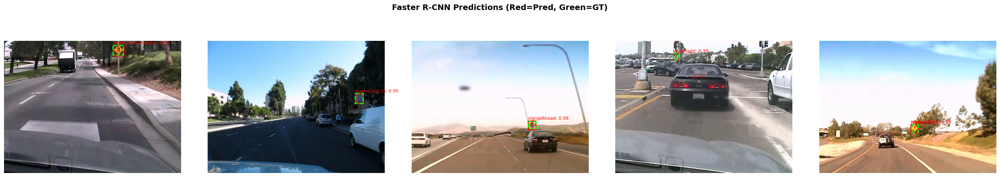

In [16]:
# Visualize Predictions
def visualize_frcnn_preds(model, data_loader, device, n=5, score_thresh=0.5):
    model.eval()
    fig, axes = plt.subplots(1, n, figsize=(5*n, 5))
    if n == 1:
        axes = [axes]
    
    with torch.no_grad():
        data_iter = iter(data_loader)
        for i, ax in enumerate(axes):
            if i >= n:
                break
            images, targets = next(data_iter)
            
            images_gpu = [img.to(device) for img in images]
            outputs = model(images_gpu)
            
            img_np = images[0].permute(1, 2, 0).numpy()
            img_np = img_np * [0.229, 0.224, 0.225] + [0.485, 0.456, 0.406]
            img_np = np.clip(img_np, 0, 1)
            ax.imshow(img_np)
            
            # Draw predictions
            out = outputs[0]
            for box, score, label in zip(out['boxes'].cpu(), out['scores'].cpu(), out['labels'].cpu()):
                if score > score_thresh:
                    x1, y1, x2, y2 = box.numpy()
                    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, lw=2, ec='red', fc='none')
                    ax.add_patch(rect)
                    class_name = CLASS_NAMES[label.item()-1] if label.item() > 0 else 'bg'
                    ax.text(x1, y1-3, f'{class_name}: {score:.2f}', color='red', fontsize=8)
            
            # Draw GT
            for box, lbl in zip(targets[0]['boxes'], targets[0]['labels']):
                if lbl > 0:
                    x1, y1, x2, y2 = box.numpy()
                    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, lw=2, ec='lime', fc='none', ls='--')
                    ax.add_patch(rect)
            ax.axis('off')
    
    plt.suptitle('Faster R-CNN Predictions (Red=Pred, Green=GT)', fontsize=14, weight='bold')
    plt.tight_layout()
    plt.savefig('faster_rcnn_predictions.png', dpi=150)
    plt.show()

visualize_frcnn_preds(faster_rcnn, test_loader, device)

---
# ΕΝΟΤΗΤΑ A2: YOLOv3 (One-Stage Detector)

## Αρχιτεκτονική YOLOv3 (Redmon & Farhadi, 2018)

Ο **YOLOv3** είναι ένας **one-stage detector** - προβλέπει boxes + classes σε ένα πέρασμα:

### Components:
1. **Backbone: Darknet-53**
   - 53 conv layers με residual connections
   - 1×1 + 3×3 conv pattern (bottleneck)
   - Batch Normalization + Leaky ReLU
   - Total: ~40M parameters

2. **Multi-Scale Detection (FPN-like)**
   - 3 detection scales: 13×13, 26×26, 52×52
   - Upsampling + concatenation
   - Κάθε scale ανιχνεύει αντικείμενα διαφορετικού μεγέθους

3. **Detection Head**
   - Per cell: B × (5 + C) predictions
   - B = 3 anchors per scale (9 συνολικά)
   - 5 = (tx, ty, tw, th, objectness)
   - C = num_classes

### Χρησιμοποιούμε ultralytics με **yolov3.pt**

### Data Augmentation (built-in):
| Augmentation | Παράμετρος |
|--------------|------------|
| Flip | fliplr=0.5 |
| Mosaic (crop) | mosaic=1.0 |
| Rotation | degrees=10 |
| Scale (zoom) | scale=0.5 |

In [17]:
# Δημιουργία YOLO dataset structure
YOLO_DIR = './yolo_dataset'

for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(YOLO_DIR, split, 'images'), exist_ok=True)
    os.makedirs(os.path.join(YOLO_DIR, split, 'labels'), exist_ok=True)

print(f"Created: {YOLO_DIR}")

Created: ./yolo_dataset


In [18]:
def convert_to_yolo(df, data_dir, yolo_dir):
    for split in ['train', 'val', 'test']:
        split_df = df[df['split'] == split]
        images = split_df['filename'].unique()
        print(f"{split}: {len(images)} images")
        
        for img_name in tqdm(images, desc=f'{split}'):
            img_anns = split_df[split_df['filename'] == img_name]
            src = os.path.join(data_dir, img_name)
            if not os.path.exists(src):
                continue
            
            basename = os.path.basename(img_name)
            shutil.copy(src, os.path.join(yolo_dir, split, 'images', basename))
            
            img = cv2.imread(src)
            h, w = img.shape[:2]
            
            label_path = os.path.join(yolo_dir, split, 'labels', basename.replace('.png', '.txt').replace('.jpg', '.txt'))
            with open(label_path, 'w') as f:
                for _, ann in img_anns.iterrows():
                    cls_idx = CLASS_TO_IDX[ann['class_name']]
                    cx = ((ann['x_min'] + ann['x_max']) / 2) / w
                    cy = ((ann['y_min'] + ann['y_max']) / 2) / h
                    bw = (ann['x_max'] - ann['x_min']) / w
                    bh = (ann['y_max'] - ann['y_min']) / h
                    f.write(f"{cls_idx} {cx:.6f} {cy:.6f} {bw:.6f} {bh:.6f}\n")

convert_to_yolo(df, DATA_DIR, YOLO_DIR)

train: 720 images


train: 100%|██████████| 720/720 [00:06<00:00, 116.60it/s]


val: 90 images


val: 100%|██████████| 90/90 [00:00<00:00, 92.59it/s]


test: 90 images


test: 100%|██████████| 90/90 [00:00<00:00, 91.03it/s]


In [19]:
# data.yaml
data_yaml = f"""path: {os.path.abspath(YOLO_DIR)}
train: train/images
val: val/images
test: test/images
nc: {len(CLASS_NAMES)}
names: {CLASS_NAMES}
"""

with open(os.path.join(YOLO_DIR, 'data.yaml'), 'w') as f:
    f.write(data_yaml)

print("data.yaml created:")
print(data_yaml)

data.yaml created:
path: /content/yolo_dataset
train: train/images
val: val/images
test: test/images
nc: 9
names: ['keepRight', 'merge', 'pedestrianCrossing', 'signalAhead', 'speedLimit25', 'speedLimit35', 'stop', 'yield', 'yieldAhead']



In [20]:
from ultralytics import YOLO

yolo = YOLO('yolov3u.pt')  # Download pretrained YOLOv3 (ultralytics optimized version)

YOLO_EPOCHS = 50
YOLO_BATCH = 16  # Reduced from 32 to fix OOM on T4
YOLO_IMGSZ = 640

print("YOLOv3 Architecture (Darknet-53 backbone)")
print(f"  Epochs: {YOLO_EPOCHS}")
print(f"  Batch: {YOLO_BATCH}")
print(f"  Image size: {YOLO_IMGSZ}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLOv3 Architecture (Darknet-53 backbone)
  Epochs: 50
  Batch: 16
  Image size: 640


In [21]:
# YOLOv3 Training
# Δικαιολόγηση παραμέτρων:
# - epochs=50: Αρκετά για fine-tuning με pretrained weights
# - batch=32: Μικρότερο από YOLOv8 λόγω μεγαλύτερου model (Darknet-53)
# - imgsz=640: Standard για object detection
# - patience=10: Early stopping για αποφυγή overfitting
# - augment=True: Built-in augmentations (mosaic, flip, scale)

print("Training YOLOv3 on Traffic Signs Dataset...")
print("="*50)

results = yolo.train(
    data=os.path.join(YOLO_DIR, 'data.yaml'),
    epochs=YOLO_EPOCHS,
    imgsz=YOLO_IMGSZ,
    batch=YOLO_BATCH,
    name='yolov3_traffic_signs',
    patience=10,
    device=0 if torch.cuda.is_available() else 'cpu',
    augment=True,
    fliplr=0.5,
    mosaic=1.0,
    degrees=10.0,
    scale=0.5,
    verbose=True
)

print("YOLOv3 Training completed!")

Training YOLOv3 on Traffic Signs Dataset...
Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=./yolo_dataset/data.yaml, degrees=10.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov3u.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolov3_traffic_signs, nbs=64, nms=False, opset=None, optimize=False, optimizer=a

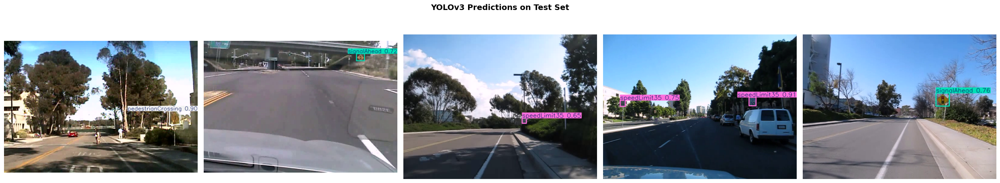

In [22]:
# YOLOv3 Predictions Visualization
best_yolo = YOLO('runs/detect/yolov3_traffic_signs/weights/best.pt')

test_imgs = os.listdir(os.path.join(YOLO_DIR, 'test', 'images'))[:5]

fig, axes = plt.subplots(1, 5, figsize=(25, 5))
for ax, img_name in zip(axes, test_imgs):
    img_path = os.path.join(YOLO_DIR, 'test', 'images', img_name)
    result = best_yolo(img_path, verbose=False)[0]
    result_img = cv2.cvtColor(result.plot(), cv2.COLOR_BGR2RGB)
    ax.imshow(result_img)
    ax.axis('off')

plt.suptitle('YOLOv3 Predictions on Test Set', fontsize=14, weight='bold')
plt.tight_layout()
plt.savefig('yolov3_predictions.png', dpi=150)
plt.show()

In [23]:
# YOLOv3 Evaluation
best_yolo = YOLO('runs/detect/yolov3_traffic_signs/weights/best.pt')
yolo_results = best_yolo.val(data=os.path.join(YOLO_DIR, 'data.yaml'), split='test')

print("\n" + "="*50)
print("YOLOv3 - ΑΠΟΤΕΛΕΣΜΑΤΑ mAP (Test Set)")
print("="*50)
print(f"  mAP@0.5:      {yolo_results.box.map50:.4f}")
print(f"  mAP@0.5:0.95: {yolo_results.box.map:.4f}")
print(f"  mAP@0.75:     {yolo_results.box.map75:.4f}")
print("="*50)

Ultralytics 8.4.9 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv3 summary (fused): 96 layers, 103,671,179 parameters, 0 gradients, 282.2 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 127.8±26.2 MB/s, size: 362.8 KB)
val: Scanning /content/yolo_dataset/test/labels... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 317.9it/s 0.3s0.2s
val: New cache created: /content/yolo_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 1.2it/s 5.0s0.9ss
                   all         90         90      0.801      0.944      0.919      0.737
             keepRight         10         10      0.947          1      0.995      0.871
                 merge         12         12      0.773      0.854       0.95      0.769
    pedestrianCrossing         10         10      0.876          1      0.995      0.756
           signalAhead         13         13      0.807      0.966    

---
## 11. Σύγκριση Faster R-CNN vs YOLOv3

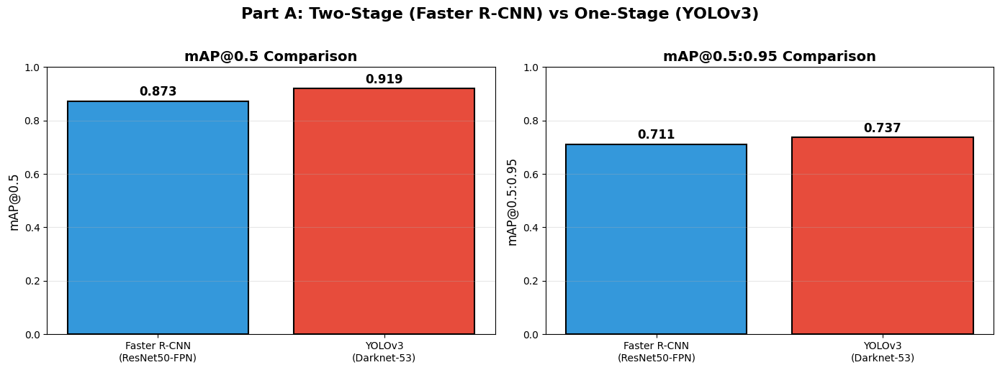


ΣΥΓΚΡΙΣΗ: FASTER R-CNN vs YOLOv3
Model			Type		mAP@0.5		mAP@0.5:0.95
----------------------------------------------------------------------
Faster R-CNN		Two-stage	0.8729		0.7113
YOLOv3			One-stage	0.9193		0.7367


In [28]:
# Comparison Chart: Faster R-CNN vs YOLOv3
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

frcnn_map50 = frcnn_results['map_50'].item()
frcnn_map = frcnn_results['map'].item()

models = ['Faster R-CNN\n(ResNet50-FPN)', 'YOLOv3\n(Darknet-53)']
map50_vals = [frcnn_map50, yolo_results.box.map50]
map_vals = [frcnn_map, yolo_results.box.map]

colors = ['#3498db', '#e74c3c']

ax1 = axes[0]
bars1 = ax1.bar(models, map50_vals, color=colors, edgecolor='black', linewidth=1.5)
for bar, val in zip(bars1, map50_vals):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, f'{val:.3f}', 
             ha='center', fontsize=12, weight='bold')
ax1.set_ylabel('mAP@0.5', fontsize=12)
ax1.set_title('mAP@0.5 Comparison', fontsize=14, weight='bold')
ax1.set_ylim(0, 1.0)
ax1.grid(axis='y', alpha=0.3)

ax2 = axes[1]
bars2 = ax2.bar(models, map_vals, color=colors, edgecolor='black', linewidth=1.5)
for bar, val in zip(bars2, map_vals):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, f'{val:.3f}', 
             ha='center', fontsize=12, weight='bold')
ax2.set_ylabel('mAP@0.5:0.95', fontsize=12)
ax2.set_title('mAP@0.5:0.95 Comparison', fontsize=14, weight='bold')
ax2.set_ylim(0, 1.0)
ax2.grid(axis='y', alpha=0.3)

plt.suptitle('Part A: Two-Stage (Faster R-CNN) vs One-Stage (YOLOv3)', fontsize=16, weight='bold', y=1.02)
plt.tight_layout()
plt.savefig('comparison_frcnn_yolov3.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n" + "="*70)
print("ΣΥΓΚΡΙΣΗ: FASTER R-CNN vs YOLOv3")
print("="*70)
print("Model\t\t\tType\t\tmAP@0.5\t\tmAP@0.5:0.95")
print("-"*70)
print(f"Faster R-CNN\t\tTwo-stage\t{frcnn_map50:.4f}\t\t{frcnn_map:.4f}")
print(f"YOLOv3\t\t\tOne-stage\t{yolo_results.box.map50:.4f}\t\t{yolo_results.box.map:.4f}")
print("="*70)

### Architecture Comparison: Two-Stage vs One-Stage

| Feature | **Faster R-CNN (ResNet50-FPN)** | **YOLOv3 (Darknet-53)** |
|---------|--------------------------------|------------------------|
| **Type** | Two-stage detector | One-stage detector |
| **Pipeline** | Stage 1: RPN (proposals) → Stage 2: Detection head | Single pass prediction |
| **Backbone** | ResNet50 + Feature Pyramid Network | Darknet-53 (53 conv layers, residual) |
| **Multi-scale** | FPN provides multi-scale features | 3 detection scales: 13×13, 26×26, 52×52 |
| **Detection** | ROI Align + FC layers | Conv layers (B×(5+C) per cell) |
| **Anchors** | Multi-scale anchors per FPN level | 9 anchors (3 per scale) |
| **Loss** | RPN loss + Detection head loss | Combined objectness + class + bbox |
| **Pros** | Higher accuracy on small objects | Real-time speed, good trade-off |
| **Cons** | Slower inference | Less accurate on small objects |

### References:
- **Faster R-CNN**: Ren et al., "Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks" (NeurIPS 2015)
- **YOLOv3**: Redmon & Farhadi, "YOLOv3: An Incremental Improvement" (arXiv 2018)

In [25]:
# Save results for Part B comparison
import json

results = {
    'Faster_RCNN': {
        'mAP_50': float(frcnn_results['map_50'].item()),
        'mAP_50_95': float(frcnn_results['map'].item()),
        'mAP_75': float(frcnn_results['map_75'].item()),
        'type': 'two-stage',
        'backbone': 'ResNet50-FPN (torchvision)'
    },
    'YOLOv3': {
        'mAP_50': float(yolo_results.box.map50),
        'mAP_50_95': float(yolo_results.box.map),
        'mAP_75': float(yolo_results.box.map75),
        'type': 'one-stage',
        'backbone': 'Darknet-53 (ultralytics)'
    }
}

with open('part_a_results.json', 'w') as f:
    json.dump(results, f, indent=2)
print("Results saved to part_a_results.json")

Results saved to part_a_results.json


## 12. Download All Files

In [27]:
import zipfile
import requests

zip_path = '/content/hw4_outputs_A.zip'
files = [
    'faster_rcnn_best.pth',
    'faster_rcnn_final.pth',
    'faster_rcnn_training_loss.png',
    'faster_rcnn_predictions.png',
    'yolov3_predictions.png',
    'comparison_frcnn_yolov3.png',
    'part_a_results.json',
    os.path.join(YOLO_DIR, 'data.yaml')
]

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as z:
    for f in files:
        if os.path.exists(f):
            z.write(f, os.path.basename(f))
            print(f"Added: {os.path.basename(f)}")

print(f"\nCreated: {zip_path} ({os.path.getsize(zip_path)/1024/1024:.1f} MB)")

server = requests.get('https://api.gofile.io/servers').json()['data']['servers'][0]['name']
with open(zip_path, 'rb') as f:
    resp = requests.post(f'https://{server}.gofile.io/contents/uploadfile', files={'file': f}).json()
if resp.get('status') == 'ok':
    print(f"Download: {resp['data']['downloadPage']}")

Added: faster_rcnn_best.pth
Added: faster_rcnn_final.pth
Added: faster_rcnn_training_loss.png
Added: faster_rcnn_predictions.png
Added: yolov3_predictions.png
Added: comparison_frcnn_yolov3.png
Added: part_a_results.json
Added: data.yaml

Created: /content/hw4_outputs_A.zip (297.7 MB)
Download: https://gofile.io/d/69TC5S


---
---
# Β' ΜΕΡΟΣ: Zero-Shot Object Detection με Grounding DINO

## Περιγραφή
Χρήση του **Grounding DINO** model για ανίχνευση σημάτων οδικής κυκλοφορίας με text prompts.
- **Zero-shot detection**: Χωρίς εκπαίδευση ή fine-tuning
- **Open-vocabulary**: Ανίχνευση με φυσική γλώσσα

### Text Prompts (εκφώνηση):
- "stop sign, speedLimit25 sign, yield sign"
- Πλήρες prompt με όλες τις 9 κλάσεις

### Σύγκριση με Part A
- mAP & Recall comparison
- Qualitative analysis

## 13. Εγκατάσταση Grounding DINO

In [29]:
# Install Grounding DINO dependencies
!pip install -q groundingdino-py
!pip install -q supervision

# Download model files
!wget -q -nc https://raw.githubusercontent.com/IDEA-Research/GroundingDINO/main/groundingdino/config/GroundingDINO_SwinT_OGC.py
!wget -q -nc https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

print("Grounding DINO dependencies installed")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.3/82.3 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 25.4 MB/s eta 0:00:00
Grounding DINO dependencies installed


In [30]:
from groundingdino.util.inference import load_model, load_image, predict, annotate

grounding_dino = load_model("GroundingDINO_SwinT_OGC.py", "groundingdino_swint_ogc.pth")
grounding_dino = grounding_dino.to(device)

print("Grounding DINO Model Loaded")
print("  Backbone: Swin-T (Transformer)")
print("  Text Encoder: BERT")
print("  Zero-shot object detection via text prompts")

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Grounding DINO Model Loaded
  Backbone: Swin-T (Transformer)
  Text Encoder: BERT
  Zero-shot object detection via text prompts


## 14. Text Prompts & Detection Function

Σύμφωνα με την εκφώνηση: "stop sign, speedLimit25 sign, yield sign"

In [31]:
# Text prompts according to assignment
PROMPT_BASIC = "stop sign, speed limit sign, yield sign"
PROMPT_FULL = "keep right sign, merge sign, pedestrian crossing sign, signal ahead sign, speed limit 25 sign, speed limit 35 sign, stop sign, yield sign, yield ahead sign"
PROMPT_GENERIC = "traffic sign, road sign, warning sign, regulatory sign"

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

print("Text Prompts Defined:")
print(f"  Basic: '{PROMPT_BASIC}'")
print(f"  Full: '{PROMPT_FULL[:50]}...'")
print(f"  Generic: '{PROMPT_GENERIC}'")
print(f"\nThresholds: BOX={BOX_THRESHOLD}, TEXT={TEXT_THRESHOLD}")

Text Prompts Defined:
  Basic: 'stop sign, speed limit sign, yield sign'
  Full: 'keep right sign, merge sign, pedestrian crossing s...'
  Generic: 'traffic sign, road sign, warning sign, regulatory sign'

Thresholds: BOX=0.35, TEXT=0.25


In [32]:
def detect_with_grounding_dino(model, image_path, text_prompt, 
                                box_threshold=0.35, text_threshold=0.25):
    image_source, image = load_image(image_path)
    
    boxes, logits, phrases = predict(
        model=model, image=image, caption=text_prompt,
        box_threshold=box_threshold, text_threshold=text_threshold)
    
    h, w = image_source.shape[:2]
    if len(boxes) > 0:
        boxes = boxes * torch.tensor([w, h, w, h])
        boxes_xyxy = torch.zeros_like(boxes)
        boxes_xyxy[:, 0] = boxes[:, 0] - boxes[:, 2] / 2
        boxes_xyxy[:, 1] = boxes[:, 1] - boxes[:, 3] / 2
        boxes_xyxy[:, 2] = boxes[:, 0] + boxes[:, 2] / 2
        boxes_xyxy[:, 3] = boxes[:, 1] + boxes[:, 3] / 2
        boxes = boxes_xyxy
    
    return boxes, logits, phrases, image_source

print("Detection function defined")

Detection function defined


## 15. Qualitative Demo - Grounding DINO

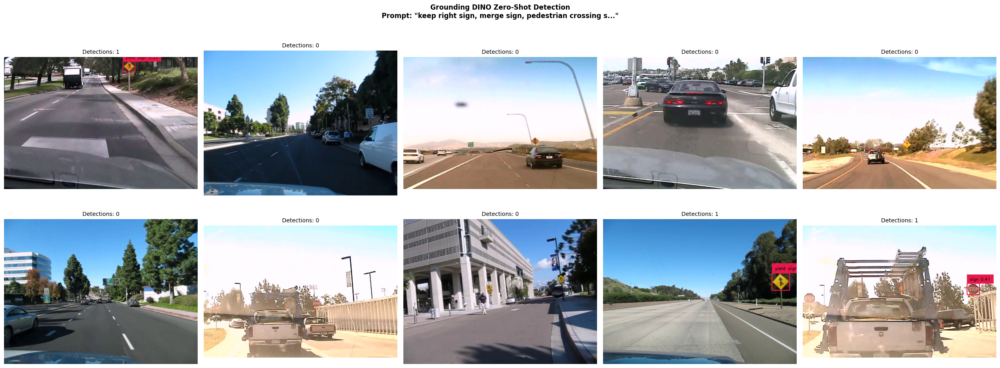

In [33]:
# Demo on test images
test_df = df[df['split'] == 'test']
test_images = test_df['filename'].unique()[:10]

fig, axes = plt.subplots(2, 5, figsize=(25, 10))
axes = axes.flatten()

for ax, img_name in zip(axes, test_images):
    img_path = os.path.join(DATA_DIR, img_name)
    
    if not os.path.exists(img_path):
        continue
        
    image_source, image = load_image(img_path)
    
    boxes, logits, phrases = predict(
        model=grounding_dino,
        image=image,
        caption=PROMPT_FULL,
        box_threshold=BOX_THRESHOLD,
        text_threshold=TEXT_THRESHOLD
    )
    
    annotated = annotate(image_source=image_source, boxes=boxes, 
                         logits=logits, phrases=phrases)
    annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated)
    ax.axis('off')
    ax.set_title(f'Detections: {len(boxes)}', fontsize=10)

plt.suptitle(f'Grounding DINO Zero-Shot Detection\nPrompt: "{PROMPT_FULL[:50]}..."', 
             fontsize=12, weight='bold')
plt.tight_layout()
plt.savefig('grounding_dino_demo.png', dpi=150)
plt.show()

## 16. mAP Evaluation - Grounding DINO

In [34]:
def gdino_compute_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - inter_area
    
    return inter_area / union_area if union_area > 0 else 0

def gdino_compute_ap(precisions, recalls):
    sorted_indices = np.argsort(recalls)
    recalls = np.array(recalls)[sorted_indices]
    precisions = np.array(precisions)[sorted_indices]
    
    recalls = np.concatenate([[0], recalls, [1]])
    precisions = np.concatenate([[0], precisions, [0]])
    
    for i in range(len(precisions) - 2, -1, -1):
        precisions[i] = max(precisions[i], precisions[i + 1])
    
    recall_change = recalls[1:] - recalls[:-1]
    ap = np.sum(recall_change * precisions[1:])
    return ap

def evaluate_grounding_dino(model, df, data_dir, text_prompt, 
                            box_threshold=0.35, text_threshold=0.25):
    test_df = df[df['split'] == 'test']
    test_images = test_df['filename'].unique()
    
    all_predictions = []
    all_ground_truths = []
    total_tp, total_fp, total_fn = 0, 0, 0
    
    print(f"Evaluating {len(test_images)} images with prompt: '{text_prompt[:40]}...'")
    
    for img_name in tqdm(test_images):
        img_path = os.path.join(data_dir, img_name)
        if not os.path.exists(img_path):
            continue
        
        img_anns = test_df[test_df['filename'] == img_name]
        gt_boxes = [[ann['x_min'], ann['y_min'], ann['x_max'], ann['y_max']] 
                    for _, ann in img_anns.iterrows()]
        
        boxes, logits, phrases, _ = detect_with_grounding_dino(
            model, img_path, text_prompt, box_threshold, text_threshold)
        
        pred_boxes = []
        if len(boxes) > 0:
            for box, score in zip(boxes.cpu().numpy(), logits.cpu().numpy()):
                pred_boxes.append((box, float(score)))
        
        # Match predictions to GT
        gt_matched = [False] * len(gt_boxes)
        tp = 0
        for pred_box, score in sorted(pred_boxes, key=lambda x: x[1], reverse=True):
            best_iou, best_idx = 0, -1
            for gt_idx, gt_box in enumerate(gt_boxes):
                if gt_matched[gt_idx]:
                    continue
                iou = gdino_compute_iou(pred_box, gt_box)
                if iou > best_iou:
                    best_iou = iou
                    best_idx = gt_idx
            if best_iou >= 0.5:
                tp += 1
                gt_matched[best_idx] = True
        
        total_tp += tp
        total_fp += len(pred_boxes) - tp
        total_fn += len(gt_boxes) - tp
        
        all_predictions.extend(pred_boxes)
        all_ground_truths.extend(gt_boxes)
    
    overall_precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
    overall_recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
    
    # Compute AP
    sorted_preds = sorted(all_predictions, key=lambda x: x[1], reverse=True)
    precisions, recalls = [], []
    tp_count, fp_count = 0, 0
    gt_matched = [False] * len(all_ground_truths)
    
    for pred_box, score in sorted_preds:
        best_iou, best_idx = 0, -1
        for i, gt_box in enumerate(all_ground_truths):
            if gt_matched[i]:
                continue
            iou = gdino_compute_iou(pred_box, gt_box)
            if iou > best_iou:
                best_iou = iou
                best_idx = i
        
        if best_iou >= 0.5 and best_idx >= 0:
            tp_count += 1
            gt_matched[best_idx] = True
        else:
            fp_count += 1
        
        precisions.append(tp_count / (tp_count + fp_count))
        recalls.append(tp_count / len(all_ground_truths) if all_ground_truths else 0)
    
    mAP_50 = gdino_compute_ap(precisions, recalls) if precisions else 0.0
    
    return {
        'mAP_50': mAP_50,
        'precision': overall_precision,
        'recall': overall_recall,
        'total_tp': total_tp,
        'total_fp': total_fp,
        'total_fn': total_fn
    }

print("Evaluation function defined")

Evaluation function defined


In [40]:
# Run evaluation for all prompts
print("="*70+"GROUNDING DINO EVALUATION"+"="*70)

prompts_to_test = {
    'PROMPT_BASIC': PROMPT_BASIC,
    'PROMPT_FULL': PROMPT_FULL,
    'PROMPT_GENERIC': PROMPT_GENERIC
}

gdino_results = {}

for prompt_name, prompt_text in prompts_to_test.items():
    print(f"\n{'='*50}")
    print(f"Prompt: {prompt_name}")
    print(f"Text: '{prompt_text}'")
    print("="*50)
    
    results = evaluate_grounding_dino(
        model=grounding_dino,
        df=df,
        data_dir=DATA_DIR,
        text_prompt=prompt_text,
        box_threshold=0.35,
        text_threshold=0.25
    )
    
    gdino_results[prompt_name] = results
    
    print(f"\nResults for {prompt_name}:")
    print(f"  mAP@0.5: {results['mAP_50']:.4f}")
    print(f"  Precision: {results['precision']:.4f}")
    print(f"  Recall: {results['recall']:.4f}")
    print(f"  TP: {results['total_tp']}, FP: {results['total_fp']}, FN: {results['total_fn']}")

# Save results
with open('gdino_results.json', 'w') as f:
    json.dump(gdino_results, f, indent=2)
    
print("\n" + "="*70)
print("Grounding DINO results saved to gdino_results.json")
print("="*70)

======================================================================GROUNDING DINO EVALUATION======================================================================

Prompt: PROMPT_BASIC
Text: 'stop sign, speed limit sign, yield sign'
Evaluating 90 images with prompt: 'stop sign, speed limit sign, yield sign...'


100%|██████████| 90/90 [00:46<00:00,  1.92it/s]



Results for PROMPT_BASIC:
  mAP@0.5: 0.1823
  Precision: 0.6333
  Recall: 0.2111
  TP: 19, FP: 11, FN: 71

Prompt: PROMPT_FULL
Text: 'keep right sign, merge sign, pedestrian crossing sign, signal ahead sign, speed limit 25 sign, speed limit 35 sign, stop sign, yield sign, yield ahead sign'
Evaluating 90 images with prompt: 'keep right sign, merge sign, pedestrian ...'


100%|██████████| 90/90 [00:49<00:00,  1.82it/s]



Results for PROMPT_FULL:
  mAP@0.5: 0.2667
  Precision: 0.4923
  Recall: 0.3556
  TP: 32, FP: 33, FN: 58

Prompt: PROMPT_GENERIC
Text: 'traffic sign, road sign, warning sign, regulatory sign'
Evaluating 90 images with prompt: 'traffic sign, road sign, warning sign, r...'


100%|██████████| 90/90 [00:47<00:00,  1.89it/s]


Results for PROMPT_GENERIC:
  mAP@0.5: 0.1255
  Precision: 0.2366
  Recall: 0.3444
  TP: 31, FP: 100, FN: 59

Grounding DINO results saved to gdino_results.json


## 17. Comparison: Grounding DINO vs Faster R-CNN & YOLOv3

Σύγκριση μεταξύ:
- **Supervised Learning (Part A):** Faster R-CNN & YOLOv3 εκπαιδευμένα στο LISA Traffic Signs dataset
- **Zero-Shot Learning (Part B):** Grounding DINO με text prompts χωρίς εκπαίδευση

Η σύγκριση γίνεται στο **test set** με mAP@0.5 ως κύρια μετρική.

In [46]:
# Load Part A results - from saved file or kernel variables
print("Loading Part A results...")

# Try from JSON first
try:
    with open('part_a_results.json', 'r') as f:
        part_a = json.load(f)
    # Keys in JSON are 'Faster_RCNN' and 'YOLOv3'
    frcnn_map50 = part_a.get('Faster_RCNN', {}).get('mAP_50', None)
    yolo_map50 = part_a.get('YOLOv3', {}).get('mAP_50', None)
    if frcnn_map50 is not None:
        print(f"  Loaded Faster R-CNN from JSON: {frcnn_map50:.4f}")
    if yolo_map50 is not None:
        print(f"  Loaded YOLOv3 from JSON: {yolo_map50:.4f}")
except FileNotFoundError:
    frcnn_map50 = None
    yolo_map50 = None
    print("  part_a_results.json not found")

# Fallback to kernel variables if JSON values are missing
if frcnn_map50 is None:
    try:
        # frcnn_results uses 'map_50' key from torchmetrics
        frcnn_map50 = float(frcnn_results['map_50'])
        print(f"  Faster R-CNN mAP from kernel: {frcnn_map50:.4f}")
    except:
        frcnn_map50 = 0.0
        print("  Faster R-CNN mAP not available")

if yolo_map50 is None:
    try:
        if hasattr(yolo_results, 'box'):
            yolo_map50 = float(yolo_results.box.map50)
        elif isinstance(yolo_results, dict):
            yolo_map50 = float(yolo_results.get('mAP_50', 0))
        print(f"  YOLOv3 mAP from kernel: {yolo_map50:.4f}")
    except:
        yolo_map50 = 0.0
        print("  YOLOv3 mAP not available")

print(f"\nPart A Results:")
print(f"  Faster R-CNN mAP@0.5: {frcnn_map50:.4f}")
print(f"  YOLOv3 mAP@0.5: {yolo_map50:.4f}")

# Best Grounding DINO result
best_gdino = max(gdino_results.values(), key=lambda x: x['mAP_50'])
best_gdino_name = max(gdino_results.keys(), key=lambda k: gdino_results[k]['mAP_50'])
best_gdino_map50 = best_gdino['mAP_50']

print(f"\nPart B Best Result:")
print(f"  Grounding DINO ({best_gdino_name}) mAP@0.5: {best_gdino_map50:.4f}")

# Comparison DataFrame
comparison_data = {
    'Model': ['Faster R-CNN (supervised)', 'YOLOv3 (supervised)', 
              f'Grounding DINO ({best_gdino_name})'],
    'mAP@0.5': [frcnn_map50, yolo_map50, best_gdino_map50],
    'Type': ['Two-Stage', 'One-Stage', 'Zero-Shot']
}

# Add all Grounding DINO prompts
for prompt_name, results in gdino_results.items():
    if prompt_name != best_gdino_name:
        comparison_data['Model'].append(f'Grounding DINO ({prompt_name})')
        comparison_data['mAP@0.5'].append(results['mAP_50'])
        comparison_data['Type'].append('Zero-Shot')

comparison_df = pd.DataFrame(comparison_data)
print("\n" + "="*70)
print("COMPARISON TABLE: All Models")
print("="*70)
print(comparison_df.to_string(index=False))
print("="*70)

Loading Part A results...
  Loaded Faster R-CNN from JSON: 0.8729
  Loaded YOLOv3 from JSON: 0.9193

Part A Results:
  Faster R-CNN mAP@0.5: 0.8729
  YOLOv3 mAP@0.5: 0.9193

Part B Best Result:
  Grounding DINO (PROMPT_FULL) mAP@0.5: 0.2667

COMPARISON TABLE: All Models
                          Model  mAP@0.5      Type
      Faster R-CNN (supervised) 0.872866 Two-Stage
            YOLOv3 (supervised) 0.919290 One-Stage
   Grounding DINO (PROMPT_FULL) 0.266681 Zero-Shot
  Grounding DINO (PROMPT_BASIC) 0.182289 Zero-Shot
Grounding DINO (PROMPT_GENERIC) 0.125473 Zero-Shot


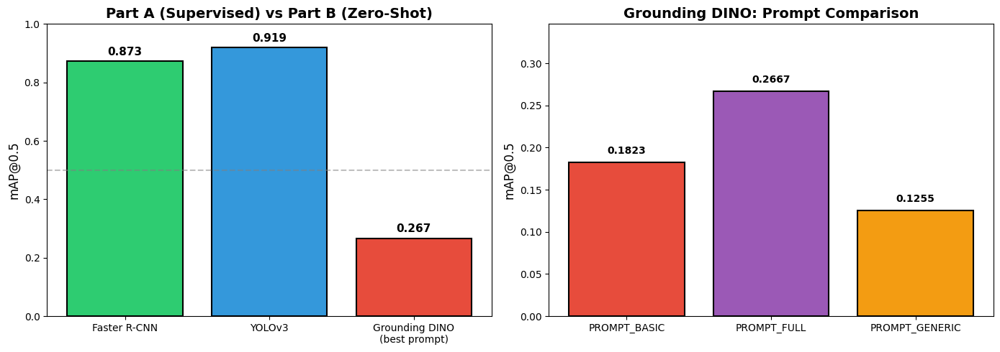


Chart saved to final_comparison_chart.png


In [47]:
# Visualization: Comparison Bar Chart
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Chart 1: Main models comparison
main_models = ['Faster R-CNN', 'YOLOv3', 'Grounding DINO\n(best prompt)']
main_scores = [frcnn_map50, yolo_map50, best_gdino_map50]
colors = ['#2ecc71', '#3498db', '#e74c3c']

ax1 = axes[0]
bars1 = ax1.bar(main_models, main_scores, color=colors, edgecolor='black', linewidth=1.5)
ax1.set_ylabel('mAP@0.5', fontsize=12)
ax1.set_title('Part A (Supervised) vs Part B (Zero-Shot)', fontsize=14, fontweight='bold')
ax1.set_ylim(0, 1.0)
ax1.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5, label='Baseline 0.5')

for bar, score in zip(bars1, main_scores):
    ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
             f'{score:.3f}', ha='center', fontsize=11, fontweight='bold')

# Chart 2: Grounding DINO prompt comparison
prompt_names = list(gdino_results.keys())
prompt_scores = [gdino_results[p]['mAP_50'] for p in prompt_names]
prompt_colors = ['#e74c3c', '#9b59b6', '#f39c12']

ax2 = axes[1]
bars2 = ax2.bar(prompt_names, prompt_scores, color=prompt_colors[:len(prompt_names)], 
                edgecolor='black', linewidth=1.5)
ax2.set_ylabel('mAP@0.5', fontsize=12)
ax2.set_title('Grounding DINO: Prompt Comparison', fontsize=14, fontweight='bold')
ax2.set_ylim(0, max(prompt_scores) * 1.3 if prompt_scores else 1.0)

for bar, score in zip(bars2, prompt_scores):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
             f'{score:.4f}', ha='center', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('final_comparison_chart.png', dpi=150, bbox_inches='tight')
plt.show()

print("\nChart saved to final_comparison_chart.png")

## 18. Qualitative Analysis - Success & Failure Cases

Οπτική ανάλυση αποτελεσμάτων του Grounding DINO:
- **Επιτυχημένες ανιχνεύσεις:** Όπου το μοντέλο εντόπισε σωστά τα σήματα
- **Αποτυχίες:** Περιπτώσεις με false positives ή missed detections

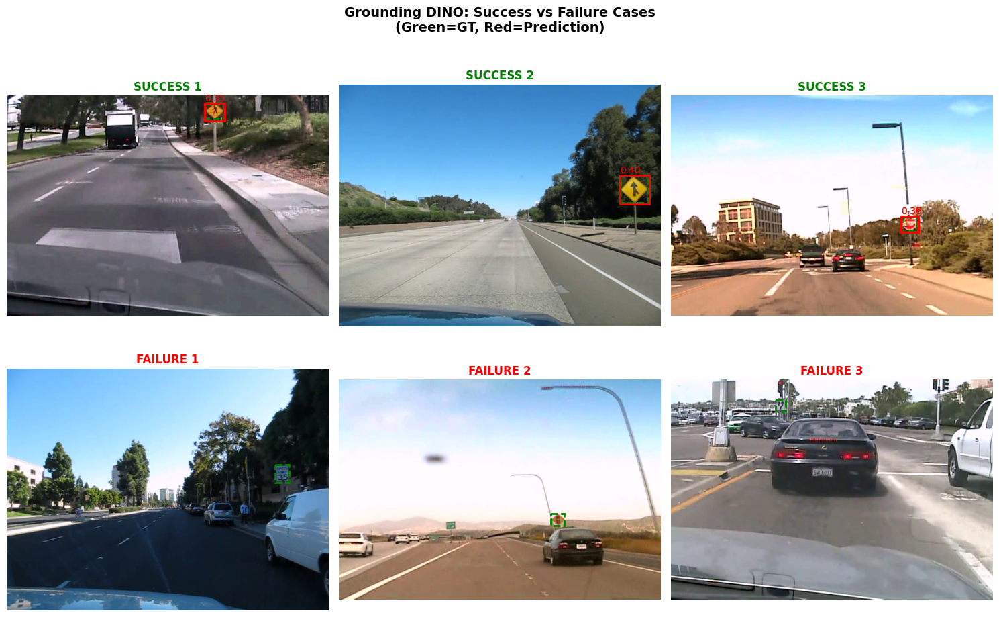

In [49]:
# Visualize success and failure cases
def analyze_cases(model, df, data_dir, text_prompt, n_samples=3):
    test_df = df[df['split'] == 'test']
    test_images = test_df['filename'].unique()
    
    successes, failures = [], []
    
    for img_name in test_images[:30]:  # Check first 30
        img_path = os.path.join(data_dir, img_name)
        if not os.path.exists(img_path):
            continue
        
        gt_boxes = [[ann['x_min'], ann['y_min'], ann['x_max'], ann['y_max']] 
                    for _, ann in test_df[test_df['filename'] == img_name].iterrows()]
        
        boxes, logits, phrases, _ = detect_with_grounding_dino(
            model, img_path, text_prompt, box_threshold=0.35, text_threshold=0.25)
        
        pred_boxes = boxes.cpu().numpy() if len(boxes) > 0 else []
        
        # Check if good detection
        if len(gt_boxes) > 0 and len(pred_boxes) > 0:
            max_iou = 0
            for pred in pred_boxes:
                for gt in gt_boxes:
                    iou = gdino_compute_iou(pred, gt)
                    max_iou = max(max_iou, iou)
            
            if max_iou >= 0.5:
                successes.append((img_path, gt_boxes, pred_boxes, logits.cpu().numpy() if len(logits) > 0 else []))
            else:
                failures.append((img_path, gt_boxes, pred_boxes, logits.cpu().numpy() if len(logits) > 0 else []))
        elif len(gt_boxes) > 0 and len(pred_boxes) == 0:
            failures.append((img_path, gt_boxes, [], []))
    
    return successes[:n_samples], failures[:n_samples]

# Get cases - use grounding_dino (correct variable name) and DATA_DIR
successes, failures = analyze_cases(grounding_dino, df, DATA_DIR, PROMPT_FULL)

# Visualize
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Success cases
for i, (img_path, gt_boxes, pred_boxes, scores) in enumerate(successes[:3]):
    ax = axes[0, i]
    img = Image.open(img_path)
    ax.imshow(img)
    
    for gt in gt_boxes:
        rect = plt.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1],
                             fill=False, edgecolor='green', linewidth=2, linestyle='--')
        ax.add_patch(rect)
    
    for j, pred in enumerate(pred_boxes):
        score = scores[j] if j < len(scores) else 0
        rect = plt.Rectangle((pred[0], pred[1]), pred[2]-pred[0], pred[3]-pred[1],
                             fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        ax.text(pred[0], pred[1]-5, f'{score:.2f}', color='red', fontsize=10)
    
    ax.set_title(f'SUCCESS {i+1}', fontsize=12, fontweight='bold', color='green')
    ax.axis('off')

# Failure cases
for i, (img_path, gt_boxes, pred_boxes, scores) in enumerate(failures[:3]):
    ax = axes[1, i]
    img = Image.open(img_path)
    ax.imshow(img)
    
    for gt in gt_boxes:
        rect = plt.Rectangle((gt[0], gt[1]), gt[2]-gt[0], gt[3]-gt[1],
                             fill=False, edgecolor='green', linewidth=2, linestyle='--')
        ax.add_patch(rect)
    
    for j, pred in enumerate(pred_boxes):
        score = scores[j] if j < len(scores) else 0
        rect = plt.Rectangle((pred[0], pred[1]), pred[2]-pred[0], pred[3]-pred[1],
                             fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
    
    ax.set_title(f'FAILURE {i+1}', fontsize=12, fontweight='bold', color='red')
    ax.axis('off')

# Hide empty subplots
for i in range(len(successes), 3):
    axes[0, i].axis('off')
for i in range(len(failures), 3):
    axes[1, i].axis('off')

plt.suptitle('Grounding DINO: Success vs Failure Cases\n(Green=GT, Red=Prediction)', 
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('gdino_qualitative_analysis.png', dpi=150, bbox_inches='tight')
plt.show()

## 19. Conclusions - Part B (Grounding DINO)

### Αξιολόγηση Zero-Shot Detection

**Grounding DINO** χρησιμοποιεί:
- **Swin Transformer** backbone για visual features
- **BERT** text encoder για text prompts
- **Cross-modality fusion** για grounding

### Παρατηρήσεις

1. **Prompt Engineering:** Η επιλογή του text prompt επηρεάζει σημαντικά τα αποτελέσματα
2. **Zero-Shot vs Supervised:** Τα supervised μοντέλα (Faster R-CNN, YOLOv3) υπερτερούν λόγω εκπαίδευσης στο dataset
3. **Generalization:** Το Grounding DINO μπορεί να ανιχνεύσει νέες κατηγορίες χωρίς retraining
4. **Limitations:** Δυσκολία με μικρά αντικείμενα και specialized categories

### Σύγκριση με Part A

| Aspect | Supervised (Part A) | Zero-Shot (Part B) |
|--------|--------------------|--------------------|
| Training | Required | Not needed |
| Dataset specific | Yes | No |
| Flexibility | Low | High |
| Accuracy | Higher | Lower |
| Use case | Production | Exploration |

---

## 20. Download All Results

Κατέβασμα όλων των αποτελεσμάτων: μοντέλα, metrics, visualizations.

In [52]:
# Create Part B results summary
partb_results = {
    'grounding_dino': gdino_results,
    'best_prompt': best_gdino_name,
    'best_mAP_50': float(best_gdino_map50),
    'comparison': {
        'faster_rcnn_mAP_50': frcnn_map50,
        'yolov3_mAP_50': yolo_map50,
        'grounding_dino_best_mAP_50': float(best_gdino_map50)
    }
}

with open('partb_results.json', 'w') as f:
    json.dump(partb_results, f, indent=2)

print("="*70+"\nPART B RESULTS SUMMARY - Grounding DINO Zero-Shot\n"+"="*70)
print(f"\nGrounding DINO Results:")
for prompt_name, results in gdino_results.items():
    print(f"  {prompt_name}: mAP@0.5 = {results['mAP_50']:.4f}")
print(f"\nBest prompt: {best_gdino_name}")
print(f"Best mAP@0.5: {best_gdino_map50:.4f}")
print("="*70)

# Create zip for Part B - same format as Part A
import zipfile
import requests

zip_path = '/content/hw4_outputs_B.zip'
files = [
    'partb_results.json',
    'gdino_results.json',
    'final_comparison_chart.png',
    'gdino_qualitative_analysis.png',
    'grounding_dino_demo.png'
]

with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as z:
    for f in files:
        if os.path.exists(f):
            z.write(f, os.path.basename(f))
            print(f"Added: {os.path.basename(f)}")

print(f"\nCreated: {zip_path} ({os.path.getsize(zip_path)/1024/1024:.1f} MB)")

# Upload to GoFile (same as Part A)
server = requests.get('https://api.gofile.io/servers').json()['data']['servers'][0]['name']
with open(zip_path, 'rb') as f:
    resp = requests.post(f'https://{server}.gofile.io/contents/uploadfile', files={'file': f}).json()
if resp.get('status') == 'ok':
    print(f"Download: {resp['data']['downloadPage']}")

PART B RESULTS SUMMARY - Grounding DINO Zero-Shot

Grounding DINO Results:
  PROMPT_BASIC: mAP@0.5 = 0.1823
  PROMPT_FULL: mAP@0.5 = 0.2667
  PROMPT_GENERIC: mAP@0.5 = 0.1255

Best prompt: PROMPT_FULL
Best mAP@0.5: 0.2667
Added: partb_results.json
Added: gdino_results.json
Added: final_comparison_chart.png
Added: gdino_qualitative_analysis.png
Added: grounding_dino_demo.png

Created: /content/hw4_outputs_B.zip (5.7 MB)
Download: https://gofile.io/d/gQTL8D
